This notebook loads disp rate maps and residual stds for each time period, plots them, and masks them with threshold value. 

For this notebook, I'm ONLY using unfiltered disp rate maps, referenced to ref pix.

This notebook was written on 4-10-23.

***

In [1]:
# import stuff
import os,sys
import glob
import pandas
from osgeo import gdal
import datetime 
from datetime import datetime
from datetime import timedelta
from dateutil import parser
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
%matplotlib  widget 

Load dates of SLCs/igrams and set directories.

In [2]:
# this one is to pick out the dates 
datesDir = '/data/ocp4/LagunaSalada/Data_and_Figs/cropped_9000_1800_18000_3600/'
# shape of unwrapped igrams
dx = 3000
dy = 750
# load in dates, make sure they are in order
dates = [os.path.basename(x) for x in glob.glob(datesDir+"SLC_vh/2*")]; dates = sorted(dates)
nd = len(dates); numIgrams = nd-1
# set the driver first, only do once.
driver=gdal.GetDriverByName('ISCE')
unwr_full_res = np.ndarray((numIgrams,dy,dx),dtype='float')

Define the intervals.

In [3]:
start_indices = [0,47,108,147,0,0]
end_indices = [46,107,146,numIgrams,88,numIgrams]
num_intervals = len(start_indices)

for i in range(num_intervals):
    print('interval '+str(i)+': '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))

interval 0: 20170510-20181125
interval 1: 20181207-20200412
interval 2: 20200418-20201208
interval 3: 20201214-20220108
interval 4: 20170510-20191220
interval 5: 20170510-20220108


Read in disp rate maps and residual std maps.

In [4]:
# read in full res disp rate files
loadDir = '/data/ocp4/LagunaSalada/Data_and_Figs/11_unwrapped_igrams/disp_rate_maps_for_intervals/'
disp_rates_weighted = np.ndarray((num_intervals,dy,dx),dtype='float') 
disp_rates_residual_std = np.ndarray((num_intervals,dy,dx),dtype='float')

for i in range(num_intervals): # range(num_intervals)
    file_name = 'interval_'+str(i)+'_weighted_by_coh_ref_to_pix.r4'
    f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
    disp_rates_weighted[i] = f1.ReadAsArray()
    file_name = 'interval_'+str(i)+'_weighted_by_coh_ref_to_pix_residual_std.r4'
    f1 = gdal.Open(loadDir+file_name, gdal.GA_ReadOnly)
    disp_rates_residual_std[i] = f1.ReadAsArray()
f1 = None
print('Files of disp rate maps and residual stds loaded.')

Files of disp rate maps and residual stds loaded.


Convert to cm.

In [5]:
# they are currently in radians, oops. Convert to cm here. 
wavelength = 5.5465763          # C-band, in cm 
rad2cm = wavelength/(4*np.pi)   # this is conversion factor that I multiply by the data (which is in rads)
disp_rates_weighted = disp_rates_weighted*rad2cm
disp_rates_residual_std = disp_rates_residual_std*rad2cm
print('Disp rate maps + stds converted to cm.')

Disp rate maps + stds converted to cm.


In [6]:
# THIS IS AN ISSUE
print(disp_rates_weighted[0])

[[-0.43136881 -0.19979122  0.88886491 ...  2.37915316  1.88585039
   0.85632394]
 [-0.42387022 -0.31982888 -0.30725368 ...  2.91429057  0.37480612
   0.58671907]
 [-0.45980585 -0.8912634  -0.03278549 ...  0.56190562  0.37978231
  -0.88825898]
 ...
 [-2.18816224 -0.59951565 -1.33519173 ...  0.62282889  3.03793501
  -3.6756539 ]
 [-2.45493896 -1.60559512 -1.30788493 ...  0.98948557  0.73906487
   0.85968332]
 [-2.13434379 -1.2029118  -0.17943663 ...  0.97992308  0.83723043
   0.71423801]]


Plot the disp rate maps.

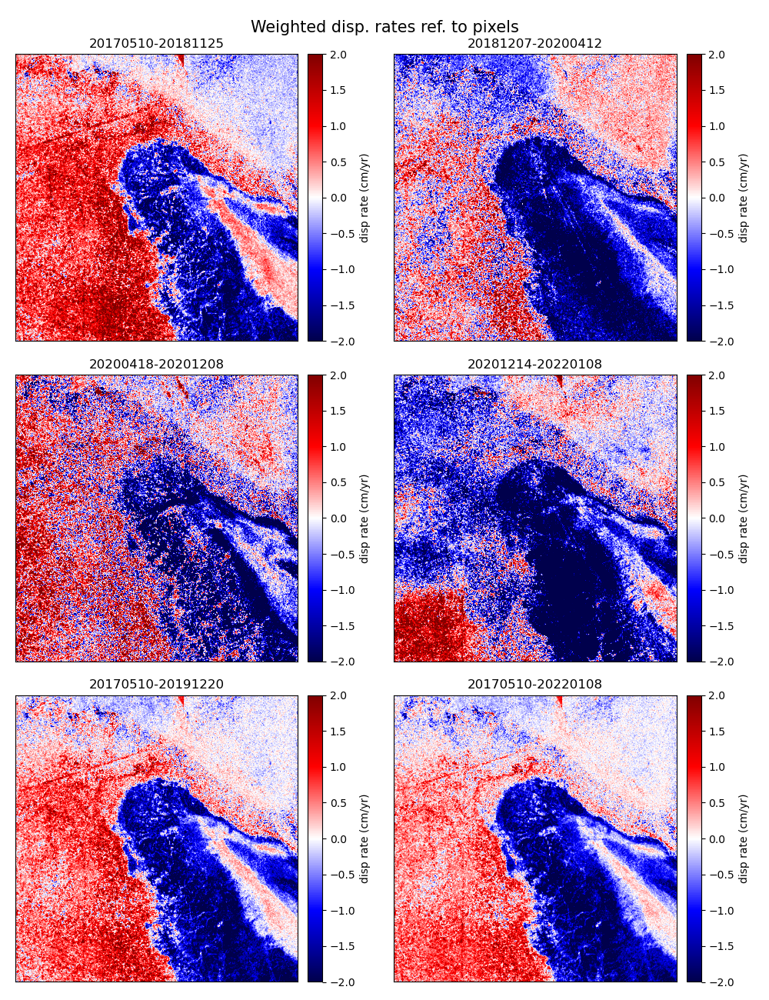

In [7]:
plt.figure(figsize=(10,13),tight_layout=True)
for i in range(num_intervals):
    plt.subplot(3,2,i+1)
    plt.imshow(disp_rates_weighted[i], aspect='auto', vmin=-2, vmax=2, extent = [0,dx,dy,0]) # interpolation='nearest'
    plt.colorbar(orientation='vertical',pad=0.03,label='disp rate (cm/yr)')
    plt.set_cmap('seismic')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    title = str(str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
    plt.title(title,fontsize=12)
    plt.xticks([]); plt.yticks([])
    title = 'Weighted disp. rates ref. to pixels'
plt.suptitle(title,fontsize=15)
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)

Plot one weighted disp rate/velocity map at a time.

interval 5, dates: 20170510-20220108


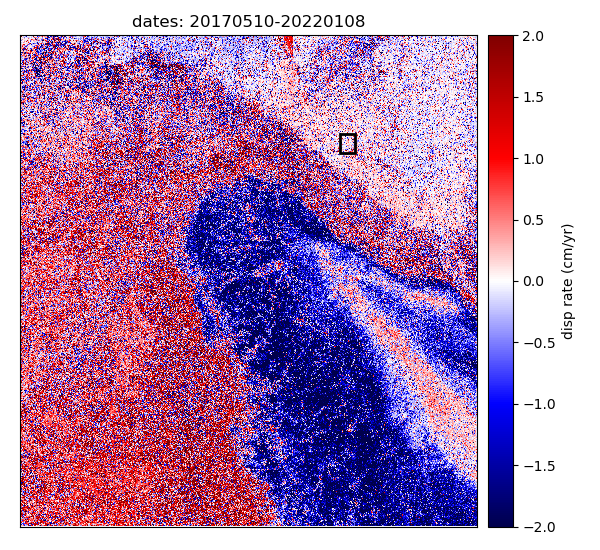

In [8]:
i = 5 # for 0-3 I used vmin=-5.0,vmax=5.0, but for 4-5 I used vmin=-3.0, vmax=3.0
print('interval '+str(i)+', dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.figure(figsize=(6,5.5),tight_layout=True)
plt.imshow(disp_rates_weighted[i], aspect='auto', vmin=-2.0, vmax=2.0,  \
            interpolation='nearest', extent = [0,dx,dy,0])
plt.colorbar(orientation='vertical',pad=0.02,label='disp rate (cm/yr)')
plt.set_cmap('seismic')
plt.xlim([dx,0]); plt.ylim([dy,0])
plt.xticks([]); plt.yticks([])
plt.gca().add_patch(Rectangle((800,150),100,30,edgecolor='k',facecolor='none',linewidth=2))
plt.title('dates: '+str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)

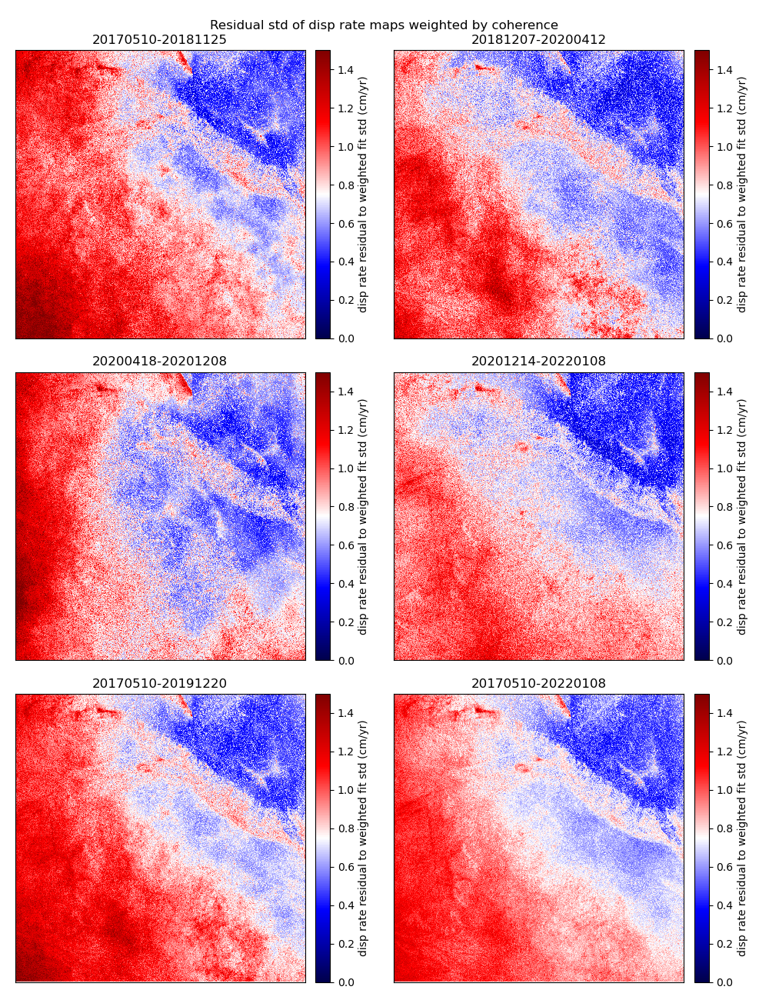

In [11]:
# plot stds of residuals from weighted fit 
plt.figure(figsize=(10,13),tight_layout=True)
for i in range(num_intervals):
    plt.subplot(3,2,i+1)
    plt.imshow(np.abs(disp_rates_residual_std[i]),aspect='auto',vmin=0,vmax=1.5,\
                    interpolation='nearest',extent = [0,dx,dy,0])
    plt.colorbar(orientation='vertical',pad=0.03,label='disp rate residual to weighted fit std (cm/yr)')
    plt.set_cmap('seismic')
    plt.xlim([dx,0]); plt.ylim([dy,0])
    title = str(str(dates[start_indices[i]])+'-'+str(dates[end_indices[i]]))
    plt.title(title,fontsize=12)
    plt.xticks([]); plt.yticks([])
plt.suptitle('Residual std of disp rate maps weighted by coherence')
plt.show()
#plt.savefig("disp_rates_period_1-2.png", transparent=True)

Quickly, just to see if there are any "good fit" points: mask where std > 1.0

In [ ]:
std_mask = np.ma.masked_where(disp_rates_residual_std[i]>1.0,disp_rates_residual_std[i])

plt.figure(figsize=(5,4.5))
plt.imshow(std_mask, cmap='viridis',interpolation='nearest',aspect='auto'); plt.xlim(dx,0); plt.xticks([]); plt.yticks([])
plt.xlabel('range'); plt.ylabel('azimuth'); plt.title('std < 1.0'); plt.colorbar(label='disp rate residual std (cm/yr)')
plt.show()